In [1]:
"""installs"""

# !pip install nc-time-axis
# !pip install netCDF4 h5netcdf
# !pip install xarray
# !pip install cdsapi
# !pip install networkx geopandas osmnx igraph matplotlib


'installs'

In [2]:
# pip install joypy


In [3]:
# pip install pysal scikit-learn libpysal tobler geopandas numpy pandas networkx
# !pip install access


## 0. Main imports & definitions

In [4]:
import sys
from pathlib import Path

# Add parent directory to Python path to enable imports from scripts/
module_path = str(Path.cwd().parent)
if module_path not in sys.path:
    sys.path.append(module_path)

import scripts_old.model as model
import scripts_old.provision as provision


In [5]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize


In [6]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import pandas as pd
import geopandas as gpd
import os
from tqdm import tqdm

tqdm.pandas()


In [7]:
"""
winter_tr -- это должно быть зимники?
"""

KELVIN_TO_CELSIUS = 273.15

# ??????????????????
UTM_CRS = 32639
MINUTES_IN_HOUR = 60

DEMAND_COL = "demand_without"
SERVICE_NAME = "hospital"
SETTL_NAME = "nao"
CONST_BASE_DEMAND = 120  # if not known (!)
SERVICE_RADIUS_MINUTES = 60 * 3


In [8]:
transport_modes = [
    "car_warm",
    "plane",
    "water_ship",
    "water_boat",
    "car_cold",
    "winter_tr",
]


In [9]:
main_data_path = "/Users/test/Documents/code/iccs25/initial_data/Арктика/"


## 1. Data reading & cleaning

In [10]:
settl = gpd.read_file(f"../data/processed/df_settlements_{SETTL_NAME}.geojson").to_crs(
    UTM_CRS
)
settl["name"] = settl["name"].str.replace("ё", "е")
settl.geometry = settl.geometry.buffer(1e3)


In [11]:
transport_df = (
    gpd.read_file(f"../data/processed/df_time_{SETTL_NAME}.geojson")
    .to_crs(UTM_CRS)
    .dropna(subset=["geometry"])
)
# Convert mode values from ',' to '.' and ensure they are float
for mode in transport_modes:
    transport_df[mode] = (
        transport_df[mode].astype(str).str.replace(",", ".").astype(float)
    )


In [12]:
transport_df[transport_modes] *= MINUTES_IN_HOUR  # convert from hours to minutes
transport_df[transport_modes] = transport_df[transport_modes].round(0)


In [13]:
infr_df = pd.read_csv(f"../data/raw/infrastructure_{SETTL_NAME}.csv", sep=";")
# Fill NaNs with 0
infr_df.fillna(0, inplace=True)


In [14]:
df_service = gpd.read_file(
    f"../data/processed/df_{SERVICE_NAME}_{SETTL_NAME}.geojson"
).to_crs(UTM_CRS)


# 1.1 Some visuals

In [15]:
settl.explore()


In [16]:
transport_df.explore()


In [17]:
msk1 = transport_df["car_cold"] == 0
msk2 = transport_df["car_warm"] != 0

transport_df[msk1 & msk2].explore()


In [18]:
import folium
from folium import FeatureGroup
import geopandas as gpd

transport_df = transport_df.to_crs(4326)

x = transport_df.union_all().centroid.x
y = transport_df.union_all().centroid.y


import folium
from folium import FeatureGroup
import geopandas as gpd

# Start a base map
m = folium.Map(
    location=[x, y], zoom_start=5, tiles="cartodbpositron", control_scale=True
)

# Define transport columns you want to show as layers
transport_cols = transport_modes

# Color palette just for better visibility
colors = ["red", "blue", "green", "purple", "orange", "black"]

# Create a layer for each transport type
for mode, color in zip(transport_cols, colors):
    fg = FeatureGroup(name=mode)

    # Filter edges with non-zero availability for this transport type
    gdf_filtered = transport_df[transport_df[mode] > 0]

    # Add each geometry as a line to the FeatureGroup
    for _, row in gdf_filtered.iterrows():
        folium.PolyLine(
            locations=[(coord[1], coord[0]) for coord in row["geometry"].coords],
            color=color,
            tooltip=f"{row['edge1']} ↔ {row['edge2']} ({mode})",
            weight=3,
        ).add_to(fg)

    fg.add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
display(m)
transport_df = transport_df.to_crs(UTM_CRS)


In [19]:
import geopandas as gpd
import folium

settl = settl.to_crs(4326)
m = folium.Map(
    location=[x, y], zoom_start=5, tiles="cartodbpositron", control_scale=True
)
# Create a FeatureGroup for settl
settl_fg = folium.FeatureGroup(name="Settlements")

# Add points as markers (or use folium.GeoJson for styling polygons)
for _, row in settl.iterrows():
    folium.CircleMarker(
        location=(row.geometry.centroid.y, row.geometry.centroid.x),
        radius=8,
        popup=transport_modes,
        color="darkgreen",
        fill=True,
        fill_opacity=0.7,
    ).add_to(settl_fg)

settl_fg.add_to(m)

# Add layer control to toggle layers
folium.LayerControl().add_to(m)

display(m)
settl = settl.to_crs(UTM_CRS)


In [20]:
df_service[df_service["capacity"] == 0].explore(column="capacity", cmap="RdYlGn")


In [21]:
transport_df.head(2)


,edge1,edge2,car_warm,plane,water_ship,water_boat,car_cold,winter_tr,mean_time,water,winter,geometry
0,Андег,Куя,0.0,0.0,45.0,45.0,0.0,0.0,45,True,False,"LINESTRING (593264.505 7532419.19, 595393.853 ..."
1,Андег,Нельмин-Нос,0.0,59.0,50.0,50.0,0.0,0.0,53,True,False,"LINESTRING (581893.86 7541908.131, 593206.526 ..."


In [22]:
settl.head(2)


,id,name,population,geometry
0,0,Амдерма,444,"POLYGON ((910678.415 7775094.746, 910673.599 7..."
1,1,Андег,175,"POLYGON ((594249.861 7532413.305, 594245.046 7..."


# 2. Preprocessing

### 2.1 Blocks scheme creation

In [23]:
blocks_gdf = model.create_blocks(settl, const_demand=CONST_BASE_DEMAND, epsg=UTM_CRS)
blocks_gdf = model.update_blocks_with_services(
    blocks_gdf, df_service, service_type=SERVICE_NAME
)


In [24]:
blocks_gdf.head(2)


,id,name,geometry,population,epsg,capacity_hospital
0,0,Амдерма,"POLYGON ((910678.415 7775094.746, 910673.599 7...",444,32639,0
1,1,Андег,"POLYGON ((594249.861 7532413.305, 594245.046 7...",175,32639,0


### 2.2 Graph creation

In [25]:
# Convert G to an undirected graph
G_undirected = nx.Graph()

# Add edges from transport_df
for _, row in transport_df.iterrows():
    for mode in transport_modes:
        if row[mode] != 0:
            G_undirected.add_edge(
                row["edge1"],
                row["edge2"],
                weight=round(row[mode], 2),
                label=mode,
            )

# Add node properties from blocks_gdf dataframe
for _, row in blocks_gdf.iterrows():
    node = row["name"]
    if node in G_undirected.nodes:
        for col in blocks_gdf.columns:
            # if col != "geometry":  # Skip geometry column
            G_undirected.nodes[node][col] = row[col]

            if col == "geometry":
                # Convert geometry to WKT format
                geom = row[col]
                if geom is not None:
                    G_undirected.nodes[node]["x"] = geom.centroid.x
                    G_undirected.nodes[node]["y"] = geom.centroid.y
                else:
                    G_undirected.nodes[node]["x"] = None
                    G_undirected.nodes[node]["y"] = None

G_undirected.graph["crs"] = settl.crs.to_epsg()


### 2.4 Copernicus temperature data collection

In [26]:
import glob
import zipfile

# Create folder structure for climate data
climate_data_dir = f"../data/climate_data/{SETTL_NAME}"
Path(climate_data_dir).mkdir(parents=True, exist_ok=True)

# Check if data already exists
nc_file = None
unzip_folder = os.path.join(climate_data_dir, "extracted")
if os.path.exists(unzip_folder):
    nc_files = glob.glob(os.path.join(unzip_folder, "*.nc"))
    if nc_files:
        nc_file = nc_files[0]
        print(f"Using existing NetCDF file: {nc_file}")
        climate_data = True
    else:
        climate_data = False
else:
    climate_data = False

# Only download if data doesn't exist
if not climate_data:
    print("Downloading climate data...")
    import cdsapi

    dataset = "projections-cmip6"
    request = {
        "temporal_resolution": "monthly",
        "experiment": "ssp5_8_5",
        "variable": "air_temperature",
        "level": ["1000"],
        "model": "inm_cm5_0",
        "year": [str(year) for year in range(2025, 2050, 1)],
        "month": [
            "01",
            "02",
            "03",
            "04",
            "05",
            "06",
            "07",
            "08",
            "09",
            "10",
            "11",
            "12",
        ],
        "area": [90, -180, -90, 180],  # Global area????????
    }

    client = cdsapi.Client()
    output_file = os.path.join(climate_data_dir, f"temperature_data_{SETTL_NAME}.zip")
    client.retrieve(dataset, request).download(output_file)

    # Extract downloaded data
    Path(unzip_folder).mkdir(exist_ok=True)
    with zipfile.ZipFile(output_file, "r") as zip_ref:
        zip_ref.extractall(unzip_folder)

    # Find extracted .nc file
    nc_files = glob.glob(os.path.join(unzip_folder, "*.nc"))
    if nc_files:
        nc_file = nc_files[0]
        print(f"Downloaded and extracted NetCDF file: {nc_file}")
    else:
        raise FileNotFoundError("No .nc file found in the extracted data")

# Load the data
import xarray as xr

ds = xr.open_dataset(nc_file)
print(ds)

# Save dataset metadata for reference
metadata_file = os.path.join(climate_data_dir, "metadata.txt")
with open(metadata_file, "w") as f:
    f.write(str(ds))


Using existing NetCDF file: ../data/climate_data/nao/extracted/ta_Amon_INM-CM5-0_ssp585_r1i1p1f1_gr1_20250116-20491216.nc
<xarray.Dataset> Size: 27MB
Dimensions:    (time: 300, bnds: 2, lat: 120, lon: 180, plev: 1)
Coordinates:
  * time       (time) object 2kB 2025-01-16 12:00:00 ... 2049-12-16 12:00:00
  * plev       (plev) float64 8B 1e+05
  * lat        (lat) float64 960B -89.25 -87.75 -86.25 ... 86.25 87.75 89.25
  * lon        (lon) float64 1kB -178.0 -176.0 -174.0 ... 176.0 178.0 180.0
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) object 5kB ...
    lat_bnds   (time, lat, bnds) float64 576kB ...
    lon_bnds   (time, lon, bnds) float64 864kB ...
    ta         (time, plev, lat, lon) float32 26MB ...
Attributes: (12/47)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            ScenarioMIP
    branch_method:          standard
    branch_time_in_child:   60225.0
    branch_time_in_parent:  60225.0
    contact:                Evgeny Vo

### 2.5 Setting temperature to G

In [27]:
# def get_season_by_temperature(temp):
#     if temp < -10:
#         return "winter"
#     elif temp > 5:
#         return "summer"
#     else:
#         return "midseason"


for node in G_undirected.nodes:
    if (
        G_undirected.nodes[node]["x"] is not None
        and G_undirected.nodes[node]["y"] is not None
    ):
        lon = G_undirected.nodes[node]["x"]
        lat = G_undirected.nodes[node]["y"]

        # Extract temperature data for the node's coordinates
        city_temp = ds["ta"].sel(lat=lat, lon=lon, method="nearest") - KELVIN_TO_CELSIUS
        G_undirected.nodes[node]["temperature"] = pd.DataFrame(
            city_temp, columns=["temperature"]
        ).round(0)

        # G_undirected.nodes[node]["season"] = G_undirected.nodes[node][
        #     "temperature"
        # ].map(get_season_by_temperature)


In [28]:
from scripts.provision2 import calculate_graph_provision

# 1. Get results from new implementation
result = calculate_graph_provision(
    G_undirected,
    SERVICE_RADIUS_MINUTES,
)

result["provision_supply"] = [1 if i > 1 else i for i in result["provision_supply"]]
result["name"] = np.array(
    [data.get("name") for _, data in G_undirected.nodes(data=True)]
)
blocks_gdf = blocks_gdf.join(result.set_index("name"), on="name", rsuffix="_provision")
# result


       origin     destination   cost
1672  Бугрино           Андег  109.0
1673  Бугрино             Куя  102.0
1674  Бугрино     Нельмин-Нос  126.0
1675  Бугрино     Архангельск  283.0
1676  Бугрино          Индига  141.0
1677  Бугрино          Мезень  478.0
1678  Бугрино      Нарьян-Мар   61.0
1679  Бугрино            Несь  199.0
1680  Бугрино     Нижняя Пеша  137.0
1681  Бугрино             Ома  153.0
1682  Бугрино    Харьягинский  354.0
1683  Бугрино            Чижа  184.0
1684  Бугрино           Шойна  210.0
1685  Бугрино  Великовисочное  152.0
1686  Бугрино         Каменка  186.0
1687  Бугрино         Коткино  302.0
1688  Бугрино       Лабожское  162.0
1689  Бугрино          Оксино  126.0
1690  Бугрино         Пылемец  134.0
1691  Бугрино        Тошвиска  212.0
1692  Бугрино          Щелино  194.0
1693  Бугрино           Вижас  162.0
1694  Бугрино       Волоковая  273.0
1695  Бугрино    Верхняя Пеша  205.0
1696  Бугрино         Волонга  296.0
1697  Бугрино         Белушье  304.0
1

In [29]:
blocks_gdf


,id,name,geometry,population,epsg,capacity_hospital,provision_supply
0,0,Амдерма,"POLYGON ((910678.415 7775094.746, 910673.599 7...",444,32639,0,1.000000
1,1,Андег,"POLYGON ((594249.861 7532413.305, 594245.046 7...",175,32639,0,1.000000
2,2,Архангельск,"POLYGON ((1090.181 7198927.317, 1085.366 71988...",296665,32639,77021,0.014732
3,3,Белушье,"POLYGON ((352743.009 7423323.177, 352738.194 7...",50,32639,0,1.000000
4,4,Бугрино,"POLYGON ((432563.787 7630967.081, 432558.972 7...",416,32639,0,0.000000
5,5,Великовисочное,"POLYGON ((545320.787 7460283.984, 545315.972 7...",544,32639,600,1.000000
6,6,Верхняя Пеша,"POLYGON ((366517.677 7391168.626, 366512.862 7...",134,32639,0,1.000000
7,7,Вижас,"POLYGON ((275118.824 7400596.389, 275114.009 7...",75,32639,0,1.000000
8,8,Волоковая,"POLYGON ((378268.421 7376488.931, 378263.606 7...",105,32639,0,1.000000
9,9,Волонга,"POLYGON ((361204.625 7449720.903, 361199.809 7...",35,32639,0,1.000000


In [30]:
# 5. Visualize results on map (using existing visualization code)
blocks_gdf.to_crs(UTM_CRS).explore(
    column="provision_supply",
    cmap="RdYlGn",
    legend=True,
    tooltip=["provision_supply"],
    name="Provision",
    style_kwds={"fillOpacity": 0.7},
)


# 4. Ok so to the modelling again...

### Для третьего года (2035) плохие показатели это ок согласно картинкам ниже с графиком изменения температур(ы)

In [43]:
threshold = 0.15


In [44]:
def sigmoid(x, center, steepness=1):
    """
    Sigmoid function for smooth probability transition
    center: temperature at which probability is 0.5
    steepness: controls how sharp the transition is
    """
    return 1 / (1 + np.exp(-steepness * (x - center)))


def get_transport_probability(transport_type, temperature):
    """
    Calculate transport probability based on temperature using smooth transitions
    """
    if transport_type == "plane":
        # Planes work better in warmer weather, degrading below -10°C
        return np.round(sigmoid(temperature, -45, 0.5), 5)

    elif transport_type in ["water_boat", "water_ship"]:
        # Water transport needs above-freezing temperatures
        return np.round(sigmoid(temperature, 0, 0.8), 5)

    elif transport_type == "car_warm":
        # Regular cars work better in warm weather
        return np.round(sigmoid(temperature, 7, 0.7), 5)

    elif transport_type in ["car_cold", "winter_tr"]:
        # Winter transport works better in cold weather
        return 1 - np.round(sigmoid(temperature, -11, 1), 5)

    return -1e6


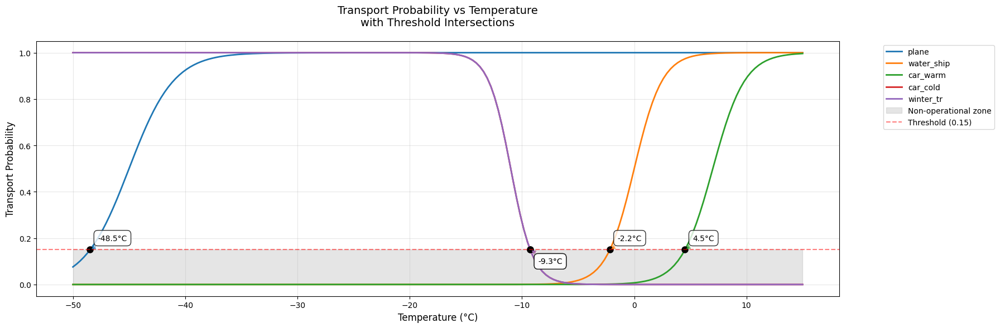

In [45]:
import matplotlib.pyplot as plt
import numpy as np



# Create temperature range and transport types
temps = np.linspace(-50, 15, 200)
transport_types = ["plane", "water_ship", "car_warm", "car_cold", "winter_tr"]

# Create figure with increased size
plt.figure(figsize=(18, 6))

# Plot probability curves and find threshold intersections
for t_type in transport_types:
    probs = [get_transport_probability(t_type, t) for t in temps]
    (line,) = plt.plot(temps, probs, label=t_type, linewidth=2)

    # Find intersection points with threshold
    for i in range(len(temps) - 1):
        if (probs[i] - threshold) * (probs[i + 1] - threshold) <= 0:
            # Linear interpolation to find exact intersection
            t_intersect = temps[i] + (temps[i + 1] - temps[i]) * (
                threshold - probs[i]
            ) / (probs[i + 1] - probs[i])
            plt.plot(t_intersect, threshold, "ko", markersize=8)
            plt.annotate(
                f"{t_intersect:.1f}°C",
                (t_intersect, threshold),
                xytext=(10, 10 if probs[i] < threshold else -10),
                textcoords="offset points",
                ha="left",
                va="bottom" if probs[i] < threshold else "top",
                bbox=dict(boxstyle="round,pad=0.5", fc="white", alpha=0.8),
                arrowprops=dict(arrowstyle="->", color=line.get_color()),
            )

# Add grey shading for area below threshold
plt.fill_between(
    temps, 0, threshold, color="grey", alpha=0.2, label="Non-operational zone"
)


# Add threshold line
plt.axhline(
    y=threshold, color="r", linestyle="--", alpha=0.5, label=f"Threshold ({threshold})"
)

plt.xlabel("Temperature (°C)", fontsize=12)
plt.ylabel("Transport Probability", fontsize=12)
plt.title(
    "Transport Probability vs Temperature\nwith Threshold Intersections",
    fontsize=14,
    pad=20,
)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


### The main calculations

In [46]:
import networkx as nx
import pandas as pd
import numpy as np


class Statistics:
    def __init__(self):
        self.records = pd.DataFrame(
            columns=[
                "idx",
                "metric",
            ]
        )
        self.graphs = list()
        self.results = list()

    def add_record(self, step_index, metrics: dict, G, result):
        new_row = pd.DataFrame(
            [
                {
                    "idx": step_index,
                    "metric": metrics.get("metric"),
                }
            ]
        )
        self.records = pd.concat([self.records, new_row], ignore_index=True)
        self.graphs.append(G)
        self.results.append(result)

    def summary(self):
        return self.records.pivot_table(index="idx", columns="col", values="metric")

    def full(self):
        return self.records


class AgglomerationNetwork:
    def __init__(self, graph, threshold):
        self.original_graph = graph.copy()
        self.graph = graph.copy()
        self.threshold = threshold
        self.stats = Statistics()
        self.current_step = 0  # Initialize current_step

    def _get_edge_temperature(self, G, u, v, idx):
        """
        RULE: Minimum temperature of the two nodes
        """

        season_u = G.nodes[u].get("temperature").loc[idx].item()
        season_v = G.nodes[v].get("temperature").loc[idx].item()

        # сравниваем по приоритету
        return np.round(np.mean([season_u, season_v]), 1)

    def assign_edge_temperatures(self, G, idx):
        for u, v in G.edges:
            G.edges[u, v]["temperature"] = self._get_edge_temperature(G, u, v, idx)

        return G

    def assign_transport_probabilities(self, G):
        """
        Assigns smooth transport probabilities based on temperature
        """
        for _, _, data in G.edges(data=True):
            transport_type = data.get("label")
            temperature = data.get("temperature")
            if transport_type and temperature:
                data["transport_probability"] = get_transport_probability(
                    transport_type, temperature
                )
            else:
                data["transport_probability"] = -1e3

    def filter_edges_by_probability(self, G, threshold):
        """
        Возвращает копию графа G, содержащую только те рёбра,
        у которых transport_probability >= threshold
        """
        G_filtered = nx.Graph()
        G_filtered.add_nodes_from(G.nodes(data=True))

        for u, v, data in G.edges(data=True):
            # print(f"edge: {u} - {v}, data: {data}")
            prob = data.get("transport_probability", 0.0)
            if prob >= threshold:
                G_filtered.add_edge(u, v, **data)
        G_filtered.graph["crs"] = G.graph["crs"]
        return G_filtered

    def analyze_node_connectivity(self, G, node_id):
        """
        Analyze connectivity for a specific node in the graph

        Args:
            G: NetworkX graph
            node_id: ID of the node to analyze

        Returns:
            Dictionary containing connected and unconnected nodes
        """
        # Get all nodes in graph
        all_nodes = set(G.nodes())

        # Get connected nodes (neighbors)
        connected_nodes = set(G.neighbors(node_id))

        # Get unconnected nodes
        unconnected_nodes = all_nodes - connected_nodes - {node_id}

        # Get edge information for connected nodes
        edge_info = {}
        for neighbor in connected_nodes:
            edge_info[neighbor] = G[node_id][neighbor]

        return {
            "node_id": node_id,
            "node_name": G.nodes[node_id].get("name", "N/A"),
            "total_nodes": len(all_nodes),
            "connected_nodes": {
                "count": len(connected_nodes),
                "nodes": connected_nodes,
                "edge_info": edge_info,
            },
            "unconnected_nodes": {
                "count": len(unconnected_nodes),
                "nodes": unconnected_nodes,
            },
        }

    def run_all_steps(self, idx):
        self.current_step = idx  # Update current_step
        self.assign_edge_temperatures(self.graph, idx)
        self.assign_transport_probabilities(self.graph)
        G_filtered = self.filter_edges_by_probability(
            self.graph, threshold=self.threshold
        )

        G, result, A = provision.calculate_graph_provision(
            G_filtered,
            SERVICE_RADIUS_MINUTES,
            CONST_BASE_DEMAND,
            service_name=SERVICE_NAME,
            return_assignment=True,
        )

        # display(result)

        avg_provision = result["provision"].mean().round(2)

        other_metrics = {
            "metric": avg_provision,
        }
        metrics = {**other_metrics}

        self.stats.add_record(step_index=idx, metrics=metrics, G=G, result=result)



net = AgglomerationNetwork(graph=G_undirected, threshold=threshold)

range_year = range(list(G_undirected.nodes(data=True))[0][1]["temperature"].shape[0])

for idx in tqdm(range_year):
    net.run_all_steps(idx)

df_stats = net.stats.records
# df_stats.groupby(df_stats.index // 12).mean().iloc[:, -1].round(2)


100%|██████████| 300/300 [00:26<00:00, 11.46it/s]


### Visuals of main calcs

/var/folders/jn/d6x3c7jd7594dtldxq22ysn80000gn/T/ipykernel_45467/3067695507.py:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.91, 1])


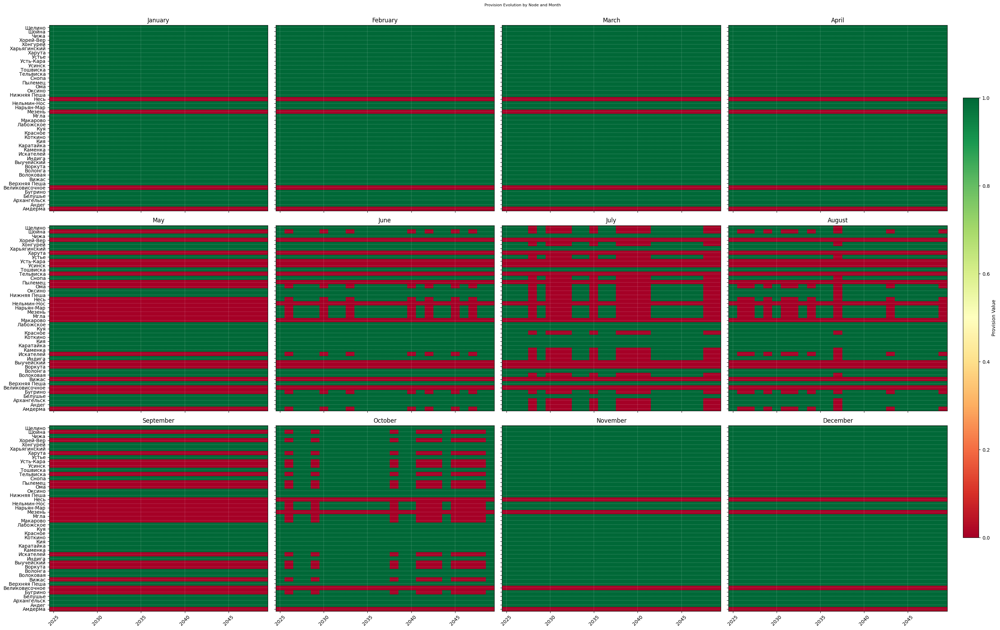

In [47]:
import matplotlib.pyplot as plt
import numpy as np


def plot_provision_evolution_by_node(results, start_year=2025, figsize=(30, 18)):
    """
    Plot provision changes over time for each node, separated by month.

    Parameters:
        results: List of DataFrames (one per timestep) with columns ['name', 'provision']
        start_year: Year of first timestep
        figsize: Size of entire plot grid
    """
    # Сбор имён нод
    node_names = sorted(
        {
            row["name"]
            for timestep in results
            for _, row in timestep.reset_index().iterrows()
        }
    )

    # Организация по месяцам
    monthly_data = {month: {name: [] for name in node_names} for month in range(12)}

    for i, timestep in enumerate(results):
        month = i % 12
        for _, row in timestep.reset_index().iterrows():
            monthly_data[month][row["name"]].append(row["provision"])

    # Сетка 3x4
    fig, axes = plt.subplots(3, 4, figsize=figsize)
    month_names = [
        "January",
        "February",
        "March",
        "April",
        "May",
        "June",
        "July",
        "August",
        "September",
        "October",
        "November",
        "December",
    ]

    for month in range(12):
        ax = axes[month // 4, month % 4]
        data = monthly_data[month]

        # Определяем число лет
        n_years = len(next(iter(data.values()), []))
        if n_years == 0:
            continue  # пропускаем пустые

        years = list(range(start_year, start_year + n_years))
        provision_matrix = np.array([data[node] for node in node_names])

        im = ax.imshow(
            provision_matrix,
            aspect="auto",
            cmap="RdYlGn",
            extent=[years[0] - 0.5, years[-1] + 0.5, -0.5, len(node_names) - 0.5],
            vmin=0,
            vmax=1,
        )

        ax.set_title(month_names[month])
        ax.set_yticks(range(len(node_names)))
        ax.set_yticklabels(node_names if month % 4 == 0 else [])
        ax.tick_params(axis="x", rotation=45)

        if month < 8:
            ax.set_xticklabels([])

        ax.grid(True, which="major", color="w", linestyle="--", linewidth=0.2)

    # Цветовая шкала
    cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
    fig.colorbar(im, cax=cbar_ax, label="Provision Value")

    fig.suptitle("Provision Evolution by Node and Month", fontsize=8, y=1)
    plt.tight_layout(rect=[0, 0, 0.91, 1])
    plt.show()


# Call the function with the results
plot_provision_evolution_by_node(net.stats.results)


In [48]:
net.stats.results[0]


,id,geometry,demand,population,capacity_hospital,demand_within,demand_without,capacity_left,closest_service,distance_to_service,assigned_to,provision
name,,,,,,,,,,,,
Андег,1.0,"POLYGON ((594249.861 7532413.305, 594245.046 7...",21.0,175.0,0.0,21.0,0.0,0.0,Нарьян-Мар,48.0,Нарьян-Мар,1.0
Куя,19.0,"POLYGON ((596389.683 7519109.234, 596384.868 7...",19.0,152.0,0.0,19.0,0.0,0.0,Нарьян-Мар,41.0,Нарьян-Мар,1.0
Нельмин-Нос,25.0,"POLYGON ((582894.059 7541909.817, 582889.244 7...",110.0,916.0,0.0,110.0,0.0,0.0,Оксино,19.0,Оксино,1.0
Архангельск,2.0,"POLYGON ((1090.181 7198927.317, 1085.366 71988...",35600.0,296665.0,77021.0,35600.0,0.0,41421.0,Архангельск,0.0,Архангельск,1.0
Индига,12.0,"POLYGON ((417408.098 7505829, 417403.282 75057...",76.0,632.0,0.0,76.0,0.0,0.0,Нижняя Пеша,35.0,Нижняя Пеша,1.0
Мезень,23.0,"POLYGON ((193059.031 7319887.06, 193054.216 73...",340.0,2832.0,600.0,340.0,0.0,260.0,Мезень,0.0,Мезень,1.0
Нарьян-Мар,24.0,"POLYGON ((585776.294 7503989.644, 585771.479 7...",2912.0,24266.0,14002.0,2912.0,0.0,9571.0,Нарьян-Мар,0.0,Нарьян-Мар,1.0
Несь,26.0,"POLYGON ((221255.413 7401069.349, 221250.598 7...",165.0,1368.0,600.0,165.0,0.0,376.0,Несь,0.0,Несь,1.0
Нижняя Пеша,27.0,"POLYGON ((358353.683 7407498.525, 358348.868 7...",87.0,718.0,600.0,87.0,0.0,262.0,Нижняя Пеша,0.0,Нижняя Пеша,1.0


<Figure size 1200x800 with 0 Axes>

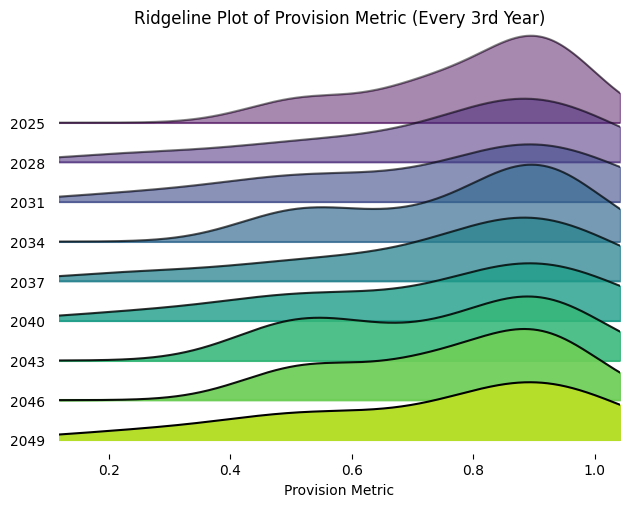

In [49]:
import joypy


# Add Year column if not already present
df_stats["Year"] = 2025 + df_stats.index // 12

# фильтр по годам, кратным 3
df_joy = df_stats[df_stats["Year"] % 3 == 0][["Year", "metric"]]
plt.figure(figsize=(12, 8))
joypy.joyplot(df_joy, by="Year", column="metric", colormap=plt.cm.viridis, fade=True)
plt.title("Ridgeline Plot of Provision Metric (Every 3rd Year)")
plt.xlabel("Provision Metric")
plt.show()


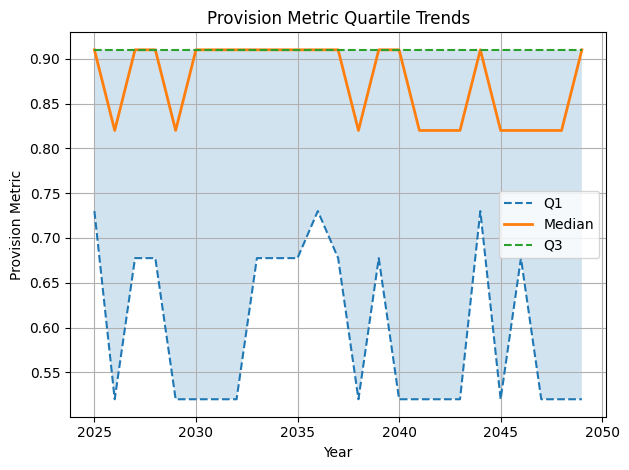

In [50]:
q_stats = df_stats.groupby("Year")["metric"].quantile([0.25, 0.5, 0.75]).unstack()
q_stats.columns = ["Q1", "Median", "Q3"]

plt.plot(q_stats.index, q_stats["Q1"], label="Q1", linestyle="--")
plt.plot(q_stats.index, q_stats["Median"], label="Median", linewidth=2)
plt.plot(q_stats.index, q_stats["Q3"], label="Q3", linestyle="--")
plt.fill_between(q_stats.index, q_stats["Q1"], q_stats["Q3"], alpha=0.2)
plt.legend()
plt.title("Provision Metric Quartile Trends")
plt.xlabel("Year")
plt.ylabel("Provision Metric")
plt.grid(True)
plt.tight_layout()
plt.show()


#### какой-то прикол с температурами в июле???

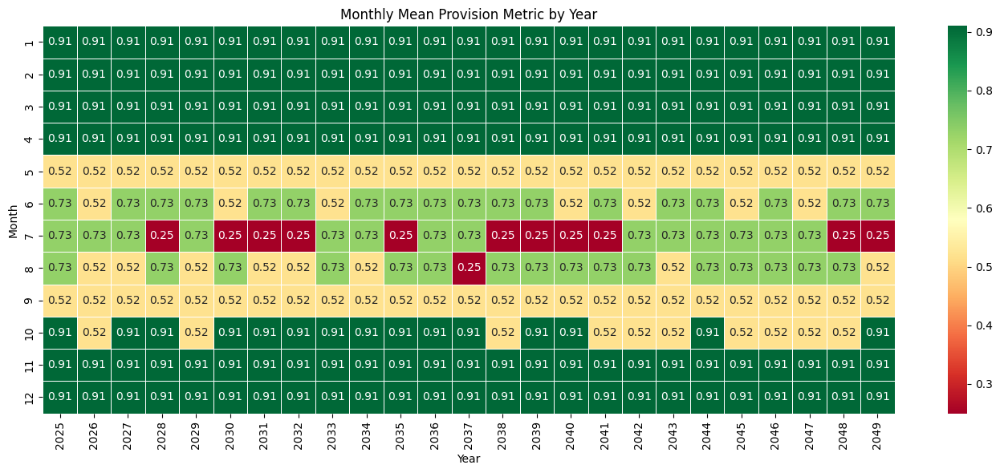

In [51]:
import seaborn as sns

# Предполагаем что индекс df_stats — это месяцы в виде `i` (0...len-1)
df_stats["Month"] = df_stats.index % 12 + 1
df_stats["Year"] = 2025 + df_stats.index // 12

# Средняя метрика по месяцам и годам
heatmap_monthly = df_stats.pivot_table(
    index="Month", columns="Year", values="metric", aggfunc="mean"
)

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_monthly, cmap="RdYlGn", annot=True, fmt=".2f", linewidths=0.5)
plt.title("Monthly Mean Provision Metric by Year")
plt.xlabel("Year")
plt.ylabel("Month")
plt.tight_layout()
plt.show()


## Отрисовка графа

array([[<Axes: title={'center': 'temperature'}>]], dtype=object)

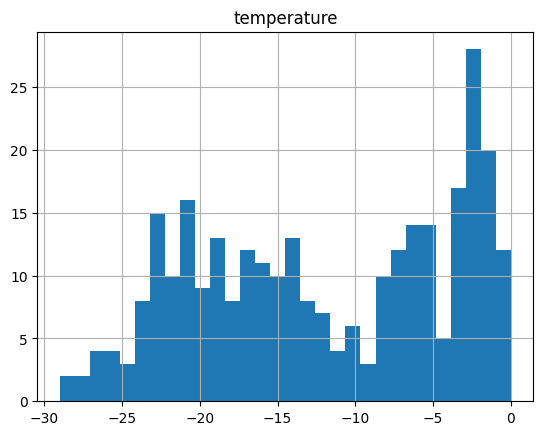

In [52]:
list(G_undirected.nodes(data=True))[25][1]["temperature"].hist(bins=30)


In [53]:
list(net.stats.graphs[0].nodes(data=True))


[('Андег',
  {'id': 1,
   'name': 'Андег',
   'geometry': <POLYGON ((594249.861 7532413.305, 594245.046 7532315.287, 594230.647 753221...>,
   'x': 593249.86128999,
   'y': 7532413.304512432,
   'population': 175,
   'epsg': 32639,
   'capacity_hospital': 0,
   'temperature':      temperature
   0          -28.0
   1          -26.0
   2          -21.0
   3          -13.0
   4           -5.0
   ..           ...
   295         -4.0
   296         -3.0
   297        -11.0
   298        -16.0
   299        -18.0
   
   [300 rows x 1 columns],
   'provision': np.float64(1.0),
   'demand_within': np.float64(21.0),
   'demand_without': np.float64(0.0),
   'capacity_left': np.float64(0.0)}),
 ('Куя',
  {'id': 19,
   'name': 'Куя',
   'geometry': <POLYGON ((596389.683 7519109.234, 596384.868 7519011.217, 596370.469 751891...>,
   'x': 595389.6834507477,
   'y': 7519109.233933821,
   'population': 152,
   'epsg': 32639,
   'capacity_hospital': 0,
   'temperature':      temperature
   0          

### (!) Несмотря на то что связь существует, не обязательно, что она попадает в норматив доступности сервиса

/var/folders/jn/d6x3c7jd7594dtldxq22ysn80000gn/T/ipykernel_45467/2500017934.py:67: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


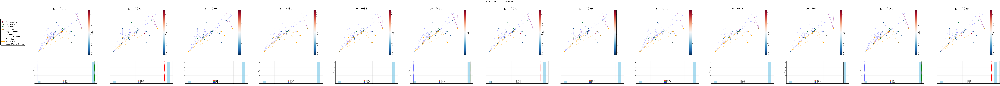

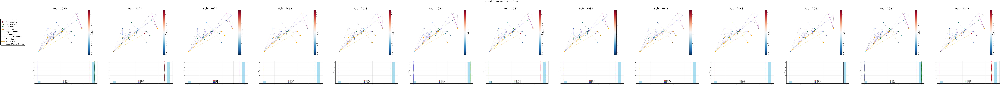

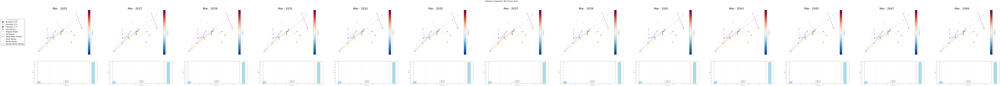

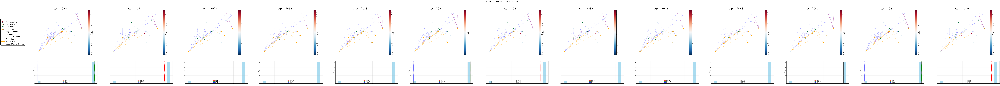

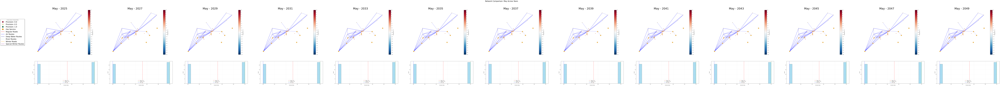

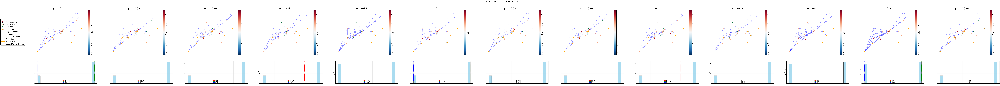

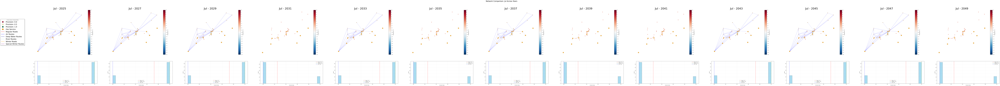

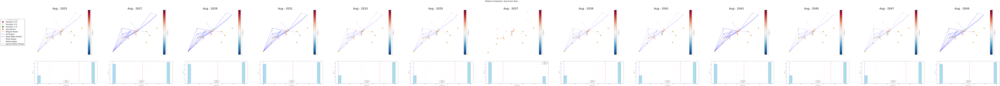

KeyboardInterrupt: 

In [54]:
def plot_colored_graph_by_season_comparison(G, month_idx, graphs, stats, step):
    """Plot comparison of network states with provision distributions"""
    month_names = [
        "Jan",
        "Feb",
        "Mar",
        "Apr",
        "May",
        "Jun",
        "Jul",
        "Aug",
        "Sep",
        "Oct",
        "Nov",
        "Dec",
    ]

    # Create figure with two rows - networks on top, histograms below
    fig = plt.figure(figsize=(20 * len(graphs), 20))
    gs = plt.GridSpec(2, len(graphs), height_ratios=[2, 1], hspace=0.2)
    axes_net = [fig.add_subplot(gs[0, i]) for i in range(len(graphs))]
    axes_hist = [fig.add_subplot(gs[1, i]) for i in range(len(graphs))]

    # Get node positions
    pos = {node: (G.nodes[node]["x"], G.nodes[node]["y"]) for node in G.nodes()}

    # Fixed temperature range for consistent visualization
    vmin_temp, vmax_temp = -30, 10
    cmap_temp = plt.cm.RdBu_r
    norm_temp = plt.Normalize(vmin=vmin_temp, vmax=vmax_temp)

    # Plot each graph and its provision distribution
    for i, (year_G, stat) in enumerate(zip(graphs, stats)):
        ax_net = axes_net[i]
        ax_hist = axes_hist[i]

        # Set network plot title
        ax_net.set_title(f"{month_names[month_idx]} - {2025 + i*step}", fontsize=40)

        # Get temperatures for current timestep
        temps = [
            year_G.nodes[node]["temperature"].iloc[month_idx].item()
            for node in year_G.nodes()
        ]

        # pos = nx.spring_layout(G, seed=42)

        # 2. Применяешь искажение:
        # pos_nonlinear = nonlinear_rescale_positions(pos, alpha=0.5, beta=1.2)
        # Draw network elements
        draw_network(year_G, pos, temps, ax_net, norm_temp, cmap_temp)

        # Add temperature colorbar
        add_temperature_colorbar(vmin_temp, vmax_temp, norm_temp, cmap_temp, ax_net)

        # Plot provision distribution histogram
        plot_provision_histogram(year_G, ax_hist)

    # Add provision legend
    add_provision_legend(axes_net[0])

    # Set figure title
    fig.suptitle(
        f"Network Comparison: {month_names[month_idx]} Across Years", fontsize=25
    )

    plt.tight_layout()
    plt.show()


def draw_network(G_input, pos, temps, ax, norm, cmap):
    """Draw network elements including edges and nodes with edges colored by transport type"""

    # Define colors for different transport modes
    transport_colors = {
        "car_warm": "red",
        "plane": "blue",
        "water_ship": "darkblue",
        "water_boat": "lightblue",
        "car_cold": "orange",
        "winter_tr": "purple",
    }

    G = G_input.copy()
    G = G.to_undirected()

    # Draw circles around nodes with services
    service_nodes = [
        node
        for node in G.nodes()
        if G.nodes[node].get(f"capacity_{SERVICE_NAME}", 0) > 0
    ]

    if service_nodes:
        nx.draw_networkx_nodes(
            G,
            pos,
            nodelist=service_nodes,
            node_color="orange",  # transparent fill
            node_size=250,  # larger than regular nodes
            edgecolors="black",
            linewidths=0.2,
            ax=ax,
        )

    # Draw edges colored by transport type
    for u, v, data in G.edges(data=True):
        transport_type = data.get("label")
        if transport_type in transport_colors:
            weight = data.get("weight", 1.0)
            norm_width = (
                0.5
                + (weight / max(e[2].get("weight", 1.0) for e in G.edges(data=True)))
                * 4.5
            )

            linestyle = "--" if weight > SERVICE_RADIUS_MINUTES else "-"

            nx.draw_networkx_edges(
                G,
                pos,
                edgelist=[(u, v)],
                edge_color=transport_colors[transport_type],
                width=norm_width,
                alpha=0.5,
                ax=ax,
                style=linestyle,
            )

    # Draw temperature nodes (larger)
    nodes = nx.draw_networkx_nodes(
        G,
        pos,
        node_color=temps,
        cmap=cmap,
        node_size=60,
        vmin=norm.vmin,
        vmax=norm.vmax,
        ax=ax,
    )

    # Draw provision nodes (smaller)
    nx.draw_networkx_nodes(
        G,
        pos,
        node_color=[G.nodes[node].get("provision", 0) for node in G.nodes()],
        cmap=plt.cm.RdYlGn,
        vmin=0,
        vmax=1,
        node_size=20,
        edgecolors="white",
        linewidths=0.8,
        ax=ax,
    )

    ax.set_axis_off()


def add_temperature_colorbar(vmin, vmax, norm, cmap, ax):
    """Add temperature colorbar with appropriate ticks"""
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    cbar = plt.colorbar(sm, ax=ax, label="Temperature (°C)")
    tick_spacing = 2
    cbar.set_ticks(np.arange(vmin, vmax + 1, tick_spacing))


def plot_provision_histogram(G, ax):
    """Plot histogram of provision values with statistics"""
    provision_values = [G.nodes[node].get("provision", 0) for node in G.nodes()]
    stats_dict = {
        "mean": np.mean(provision_values),
        "median": np.median(provision_values),
        "min": np.min(provision_values),
    }

    # Plot histogram
    ax.hist(
        provision_values,
        bins=20,
        range=(0, 1),
        color="skyblue",
        edgecolor="black",
        alpha=0.7,
    )

    # Add statistic lines
    colors = {"mean": "red", "median": "green", "min": "blue"}
    for stat_name, value in stats_dict.items():
        ax.axvline(
            x=value,
            color=colors[stat_name],
            linestyle="--",
            label=f"{stat_name.capitalize()}: {value:.2f}",
        )

    ax.set_xlabel("Provision Value")
    ax.set_ylabel("Count")
    ax.legend()
    ax.grid(True, alpha=0.3)


def add_provision_legend(ax):
    """Add provision value, transport mode, and service node legends to the left side of the plot"""
    # Provision legend elements
    provision_elements = [
        plt.Line2D(
            [0],
            [0],
            marker="o",
            color="none",
            markerfacecolor=plt.cm.RdYlGn(val),
            label=f"Provision: {val:.1f}",
            markersize=20,
        )
        for val in [0.0, 0.5, 1.0]
    ]

    # Service node indicator
    service_element = [
        plt.Line2D(
            [0],
            [0],
            marker="o",
            color="none",
            markerfacecolor="orange",
            label="Has Service",
            markersize=20,
        )
    ]

    # Transport mode legend elements
    transport_colors = {
        "Regular Roads": "red",
        "Air Routes": "blue",
        "Deep Water Routes": "darkblue",
        "River Routes": "lightblue",
        "Winter Roads": "orange",
        "Special Winter Routes": "purple",
    }

    transport_elements = [
        plt.Line2D([0], [0], color=color, label=mode, linewidth=2)
        for mode, color in transport_colors.items()
    ]

    # Create a single legend with all elements
    all_elements = provision_elements + service_element + transport_elements

    ax.legend(
        handles=all_elements,
        bbox_to_anchor=(-0.2, 0.5),
        loc="center right",
        borderaxespad=0,
        fontsize=25,
        title="Provision Values & Transport Modes",
        frameon=True,
        edgecolor="black",
        fancybox=True,
        shadow=True,
    )


def plot_network_evolution_by_month(net, step):
    """Plot network evolution for each month"""
    graphs_by_month = {month: [] for month in range(12)}
    stats_by_month = {month: [] for month in range(12)}

    # Organize graphs and stats by month
    for year in range(0, len(net.stats.graphs) // 12, step):
        start_idx = year * 12
        for month in range(12):
            idx = start_idx + month
            if idx < len(net.stats.graphs):
                graphs_by_month[month].append(net.stats.graphs[idx])
                stats_by_month[month].append(net.stats.records["metric"].iloc[idx])

    # Plot each month's evolution
    for month_idx in range(12):
        if graphs_by_month[month_idx]:
            plot_colored_graph_by_season_comparison(
                G_undirected,
                month_idx,
                graphs_by_month[month_idx],
                stats_by_month[month_idx],
                step=step,
            )


# Call the visualization
plot_network_evolution_by_month(net, step=2)


# Выводы (вопросы Любы)

### 1.  prediction of network node attributes (provision type etc.) given structural network node properties (betweenness measures)

### 2.  we can represent the network of connectivity between cities  as multilayed network (structuring it by node attributes or by link types), this representation is an alternative  representation of seasonal  data as network structures

### 3. Main (hub "опорные") cities selection based on the connectivity types. Depending on the connectivity type we can get separate main hub cities.

### 4. Characterisation of critical moments (given structural and node attribute properties). How to distinguish them using network analysis (solely) ?